# NAMA : JUSTIN THAMES
# NIM : 03081200010

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# Deskripsi data

In [3]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


# Cleansing Data

In [4]:
df.isnull().sum()
df[df.duplicated(keep='first')]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
5,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
22,Resort Hotel,0,72,2015,July,27,1,2,4,2,...,No Deposit,250.0,NaN,0,Transient,84.67,0,1,Check-Out,2015-07-07
43,Resort Hotel,0,70,2015,July,27,2,2,3,2,...,No Deposit,250.0,NaN,0,Transient,137.00,0,1,Check-Out,2015-07-07
138,Resort Hotel,1,5,2015,July,28,5,1,0,2,...,No Deposit,240.0,NaN,0,Transient,97.00,0,0,Canceled,2015-07-01
200,Resort Hotel,0,0,2015,July,28,7,0,1,1,...,No Deposit,240.0,NaN,0,Transient,109.80,0,3,Check-Out,2015-07-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119349,City Hotel,0,186,2017,August,35,31,0,3,2,...,No Deposit,9.0,NaN,0,Transient,126.00,0,2,Check-Out,2017-09-03
119352,City Hotel,0,63,2017,August,35,31,0,3,3,...,No Deposit,9.0,NaN,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
119353,City Hotel,0,63,2017,August,35,31,0,3,3,...,No Deposit,9.0,NaN,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
119354,City Hotel,0,63,2017,August,35,31,0,3,3,...,No Deposit,9.0,NaN,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03


In [5]:
df.drop(["company","arrival_date_week_number","reservation_status_date"], axis=1, inplace=True)

In [6]:
df3 = df.loc[df["is_canceled"] == 0].copy()

In [7]:
nan_replacements = {"children": 0}
df3 = df3.fillna(nan_replacements)

In [8]:
df3['total_guests'] = df3['adults'] + df3['children'] + df3['babies']

In [9]:
df3['total_nights'] = df3['stays_in_weekend_nights'] + df3['stays_in_week_nights'] 

In [10]:
df3['price_per_guest'] = (df3['adr']/df3["total_guests"])

# Explorary Data Analysis

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 29 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_day_of_month       119390 non-null  int64  
 6   stays_in_weekend_nights         119390 non-null  int64  
 7   stays_in_week_nights            119390 non-null  int64  
 8   adults                          119390 non-null  int64  
 9   children                        119386 non-null  float64
 10  babies                          119390 non-null  int64  
 11  meal                            119390 non-null  object 
 12  country         

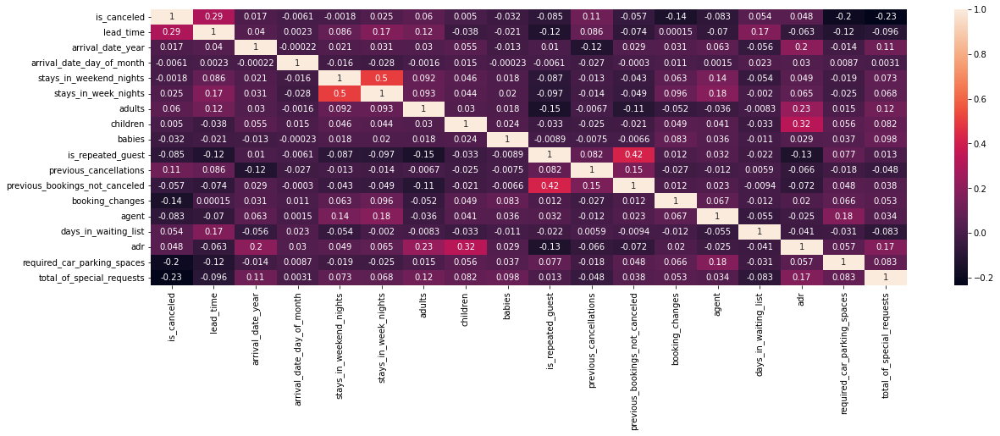

In [12]:
plt.figure(figsize=(20,6))
sns.heatmap(df.corr(),annot=True)
plt.show()

In [13]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             float64
days_in_waiting_list              

In [14]:
df.shape

(119390, 29)

In [15]:
from pandas_profiling import ProfileReport

In [16]:
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
df.nunique()

hotel                                2
is_canceled                          2
lead_time                          479
arrival_date_year                    3
arrival_date_month                  12
arrival_date_day_of_month           31
stays_in_weekend_nights             17
stays_in_week_nights                35
adults                              14
children                             5
babies                               5
meal                                 5
country                            177
market_segment                       8
distribution_channel                 5
is_repeated_guest                    2
previous_cancellations              15
previous_bookings_not_canceled      73
reserved_room_type                  10
assigned_room_type                  12
booking_changes                     21
deposit_type                         3
agent                              333
days_in_waiting_list               128
customer_type                        4
adr                      

In [18]:
df.index

RangeIndex(start=0, stop=119390, step=1)

In [19]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status'],
      dtype='object')

In [20]:
df.memory_usage()

Index                                128
hotel                             955120
is_canceled                       955120
lead_time                         955120
arrival_date_year                 955120
arrival_date_month                955120
arrival_date_day_of_month         955120
stays_in_weekend_nights           955120
stays_in_week_nights              955120
adults                            955120
children                          955120
babies                            955120
meal                              955120
country                           955120
market_segment                    955120
distribution_channel              955120
is_repeated_guest                 955120
previous_cancellations            955120
previous_bookings_not_canceled    955120
reserved_room_type                955120
assigned_room_type                955120
booking_changes                   955120
deposit_type                      955120
agent                             955120
days_in_waiting_

In [21]:
df.nlargest(5,'lead_time')

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status
1,Resort Hotel,0,737,2015,July,1,0,0,2,0.0,...,C,4,No Deposit,NaN,0,Transient,0.0,0,0,Check-Out
4182,Resort Hotel,0,709,2016,February,25,8,20,2,0.0,...,E,2,No Deposit,NaN,0,Transient,68.0,0,0,Check-Out
65231,City Hotel,1,629,2017,March,30,0,1,1,0.0,...,A,0,Non Refund,1.0,0,Transient,59.0,0,0,Canceled
65235,City Hotel,1,629,2017,March,30,0,1,1,0.0,...,A,0,Non Refund,1.0,0,Transient,59.0,0,0,Canceled
65237,City Hotel,1,629,2017,March,30,0,2,2,0.0,...,A,0,Non Refund,1.0,0,Transient,62.0,0,0,Canceled


In [22]:
df['is_canceled'].value_counts()

0    75166
1    44224
Name: is_canceled, dtype: int64

In [23]:
df.isna().head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [24]:
df.size

3462310

In [25]:
df.ndim

2

# Proportion of guests represent babies, children and adults respectively

In [26]:
labels = ["babies", "children", "adults"]

def piePlot(data,title):
    
    
    plt.pie(data, labels=labels, autopct='%1.1f%%', colors= ['#455d7a','#a7bcb9','#97cba9'])
    plt.title(title)
    my_circle = plt.Circle( (0,0), 0.7, color='white')
    plt.gca().add_artist(my_circle)
    plt.legend(["babies", "children", "adults"])
    plt.rcParams['font.size'] = 15.0
    plt.rcParams["font.family"] = "serif"
    plt.axis('equal')
    fig = plt.gcf()
    fig.set_size_inches(6,6)
    plt.show()

In [27]:
def sum_guest_type(value):
    
    type_total = (df3.loc[(df3[value]>=1) & (df3["hotel"]=="Resort Hotel")])
    type_total = type_total[value].sum()
    
    return type_total

In [28]:
total_babies_rh = sum_guest_type("babies")
total_children_rh = sum_guest_type("children")
total_adults_rh = sum_guest_type("adults")
total_guests_rh = sum_guest_type("total_guests")

total_babies_rh, total_children_rh,total_adults_rh, total_guests_rh

(452, 3075.0, 53024, 56551.0)

In [29]:
def guest_type_percent(value):
    
    per_cent = round((value / total_guests_rh) * 100, 2)
    return per_cent

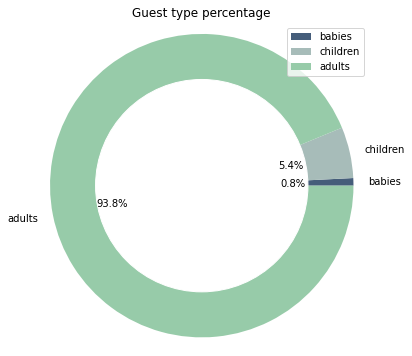

In [30]:
percent_babies_rh = guest_type_percent(total_babies_rh)
percent_children_rh = guest_type_percent(total_children_rh)
percent_adults_rh = guest_type_percent(total_adults_rh)

data2 = [percent_babies_rh, percent_children_rh, percent_adults_rh]
piePlot(data2,"Guest type percentage")

Keterangan : Berdasarkan pie chart diatas dapat dikatakan bahwa, tamu orang dewasa sebesar 93.8%,  anak-anak sebesar 5,4% dan bayi sebesar 0,8%. Pie chart ini berdasarkan data dar semua observasi resort hotel.

# Peak season with children and without children

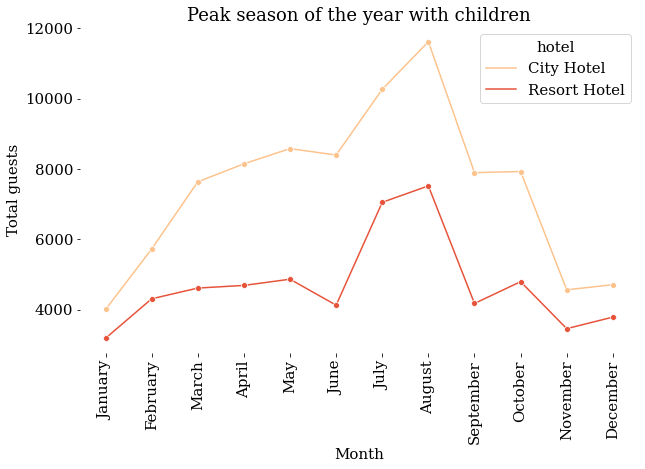

In [31]:
df3["arrival_date_month"]= pd.Categorical(df3["arrival_date_month"],['January', 'February','March','April','May','June','July','August','September','October','November','December'])
p5 = df3.pivot_table(index=['arrival_date_month','hotel'],
                   values=['total_guests'],
                   aggfunc="sum").reset_index()

c3 = sns.lineplot(x='arrival_date_month',
             y='total_guests',
             hue='hotel',
             data=p5, palette="OrRd",
                 marker = "o")

sns.despine(bottom = True, left = True)
plt.xticks(rotation=90) 
plt.title("Peak season of the year with children")
plt.ylabel("Total guests")
plt.xlabel("Month")
fig = plt.gcf()
fig.set_size_inches(10,6)
plt.show()

Keterangan : Berdasarkan hasil observasi diatas dapat dikatakan bahwa peak season turis yang bepergian dengan anak-anak adalah antara bulan july dan agustus. Kemudian, keluarga pengunjung cenderung melakukan perjalanan pada musim liburan sekolah yaitu juni-september dan musiman ini biasanya lebih menonjol dari pada pengunjung non keluarga. Januari dan november merupakan bulan dengan pengunjung yang kurang dikunjungi dalam grafik peak season dengan anak-anak tersebut.

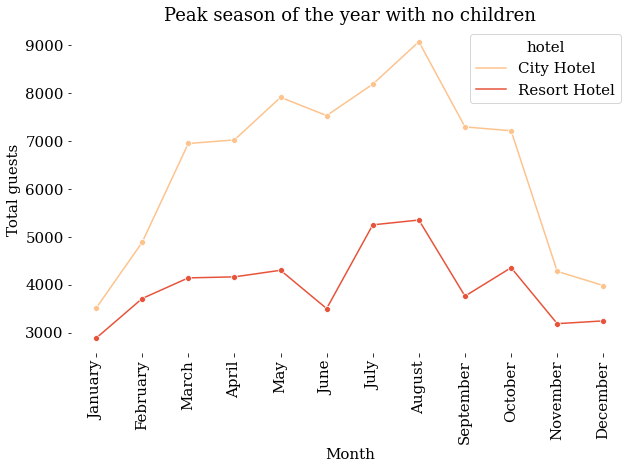

In [32]:
df2 = df3.loc[(df3.children == 0) & (df3.babies == 0)].copy()

df2["arrival_date_month"]= pd.Categorical(df2["arrival_date_month"],['January', 'February','March','April','May','June','July','August','September','October','November','December'])
p6 = df2.pivot_table(index=['arrival_date_month','hotel'],
                   values=['total_guests'],
                   aggfunc="sum").reset_index()

c4 = sns.lineplot(x='arrival_date_month',
             y='total_guests',
             hue='hotel',
             data=p6,
                 palette="OrRd",
                  marker = "o")

sns.despine(bottom = True, left = True)
plt.xticks(rotation=90) 
plt.title("Peak season of the year with no children")
plt.ylabel("Total guests")
plt.xlabel("Month")
fig = plt.gcf()
fig.set_size_inches(10,6)
plt.show()

Keterangan : Berdasarkan hasil observasi diatas dapat dikatakan bahwa peak season turis yang bepergian tanpa dengan anak-anak adalah antara bulan july dan agustus. Musiman ini kurang l menonjol dari pada pengunjung keluarga. Januari dan november merupakan bulan dengan pengunjung yang kurang dikunjungi dalam grafik peak season non keluarga tersebut

# Weakest and strongest market segment of each hotel

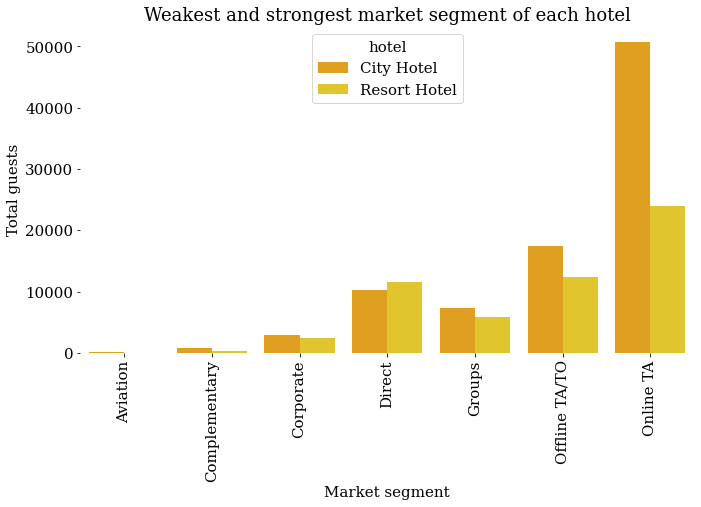

In [33]:
p2 = df3.pivot_table(index=['market_segment','hotel'],
                   values=['total_guests'],
                   aggfunc="sum").reset_index()

c2 = sns.barplot(x="market_segment",
                y="total_guests",
                hue="hotel",
                data=p2,
                palette = "Wistia_r")
plt.xticks(rotation=90)
plt.title("Weakest and strongest market segment of each hotel")
plt.ylabel("Total guests")
plt.xlabel("Market segment")
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(11,6)
plt.show()

Keterangan : untuk market segment yang paling banyak dibooking oleh para tamu adalah online travel agency dan offline travel agency. Aviation, complementary dan corporate memiliki jumlah booking yang paling sedikit.

# Percentage of cancelations per month in each hotel

In [34]:
d = df.groupby(['hotel','arrival_date_month']).agg({'is_canceled':'sum', 'meal':'count'}).reset_index().rename(columns={'is_canceled':'canceled_bookings', 'meal':'total_bookings'})
d['cancelation_percentage'] = (d['canceled_bookings']/d['total_bookings'])*100

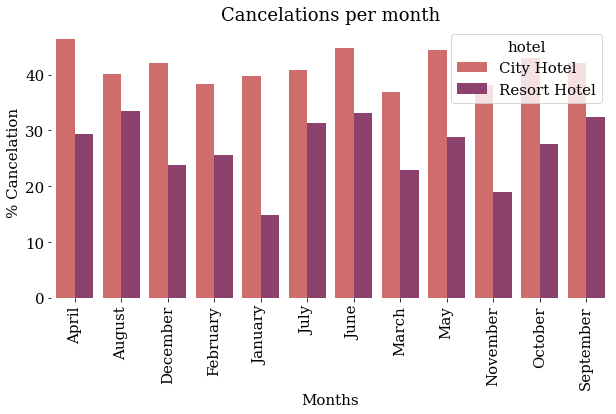

In [35]:
plt.figure(figsize=(10,5))
sns.barplot(x='arrival_date_month', y='cancelation_percentage', hue='hotel', data=d, palette = "flare")
plt.xticks(rotation=90)
sns.despine(bottom = True, left = True)
plt.xlabel("Months")
plt.ylabel("% Cancelation")
plt.title("Cancelations per month")
plt.show()

Keterangan : Berdasarkan data diatas, dapat dikatakan bahwa persentasi cancellation of the month sangat tinggi dimana sekitar 40% untuk City hotel dan 30% untuk Resort hotel.

# Count of the type of customer each market segment is booking

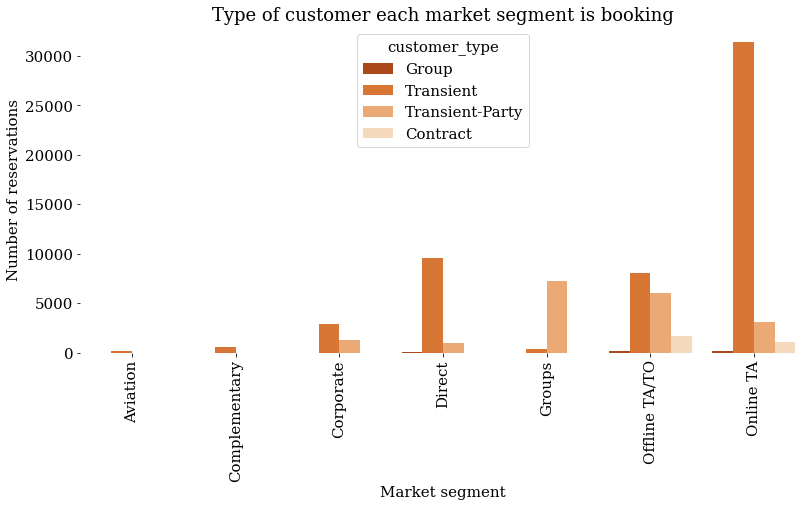

In [36]:
tp3 = pd.crosstab(index= df3['market_segment'],
                  columns= df3["customer_type"], 
                  values= df3['total_guests'], 
                  aggfunc ="count")

stacked = tp3.stack().reset_index().rename(columns={0:'total_guests'})

p = sns.barplot(x=stacked.market_segment, y=stacked.total_guests, hue=stacked.customer_type, palette= "Oranges_r")
plt.xticks(rotation=90)
plt.title("Type of customer each market segment is booking")
plt.ylabel("Number of reservations")
plt.xlabel("Market segment")
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(13,6)
plt.show()

Keterangan : Berdasarkan data diatas dapat dikatakan bahwa yang paling banyak pemesanan untuk chanel pemesanan adalah tamu Transiet dan Transiet Party. Hanya agen perjalanan offline dan online yang memesan Tamu kontrak.

# Peak seasons based on the guest type

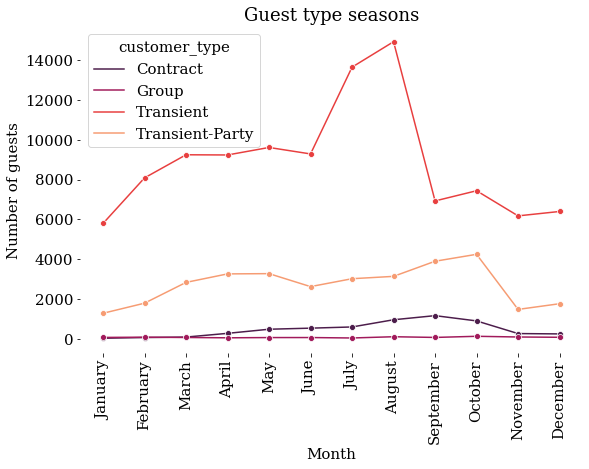

In [37]:
tp1 = pd.crosstab(index= df3['arrival_date_month'],
                  columns= df3["customer_type"], 
                  values= df3['total_guests'], 
                  aggfunc ="sum")

stacked = tp1.stack().reset_index().rename(columns={0:'total_guests'})

p = sns.lineplot(x=stacked.arrival_date_month, y=stacked.total_guests, hue=stacked.customer_type, palette="rocket",  marker = "o")
plt.xticks(rotation=90)
plt.title("Guest type seasons")
plt.ylabel("Number of guests")
plt.xlabel("Month")
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(9,6)
plt.show()

Keterangan : Tipe tamu grup sangat rendah sepanjang tahun. Terdapat peak season untuk tamu Transiet-Party di bulan oktober. Kemudian, musim puncak untuk tamu Transient antara Juli dan Agustus. Jumlah tamu kontrak sangat rendah selama paruh pertama tahun ini.

# Countries do the guests come from

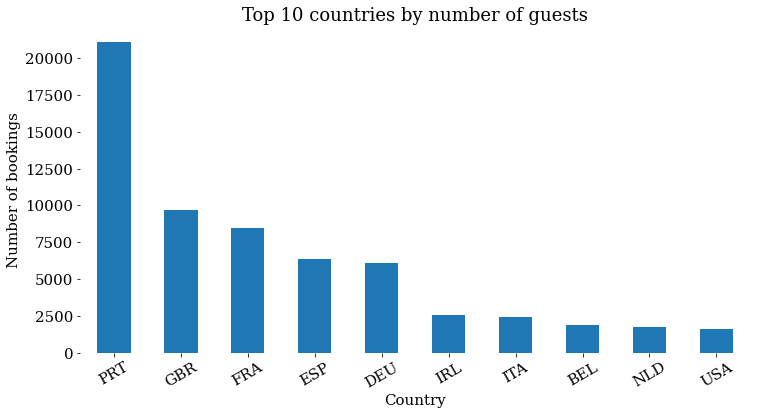

In [38]:
d = df3['country'].value_counts()
plt.figure(figsize=(12,6))
d.sort_values(ascending=False)[:10].plot(kind='bar')
plt.xticks(rotation=30)
sns.despine(bottom = True, left = True)
plt.xlabel("Country")
plt.ylabel("Number of bookings")
plt.title("Top 10 countries by number of guests")
plt.show()



Keterangan :  Berdasarkan hasil data diatas, kebanyakan turis berasal dari Portugal sebesar 28,03%, UK sebesar 12,9% dan France sebesar 11,3%. Kemudian, kebanyakan turis berasal dari eropa karena eropa termasuk dalam top 5.

# price per guest according to month and hotel

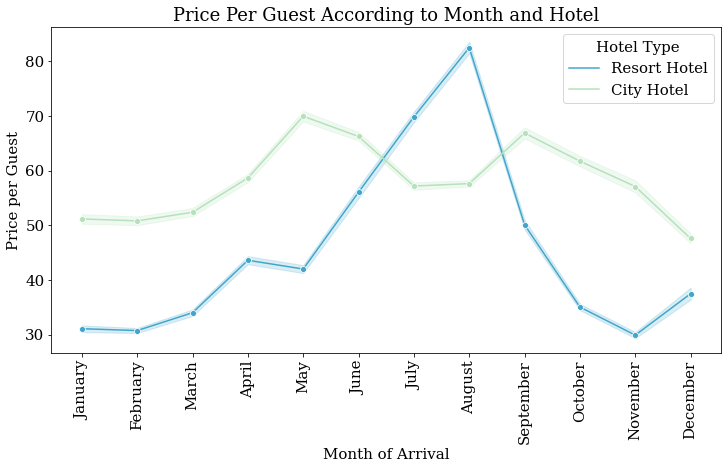

In [39]:
plt.figure(figsize = (12,6))
fig = sns.lineplot(x = 'arrival_date_month', 
             y = 'price_per_guest', 
             hue = 'hotel', 
             data = df3,
                  palette="GnBu_r",
                   marker = "o")

plt.xticks(rotation=90)
plt.xlabel('Month of Arrival')
plt.ylabel('Price per Guest')
plt.legend(title = 'Hotel Type')
plt.title('Price Per Guest According to Month and Hotel', fontsize = 18); 

Keterangan : Berdasarkan data diatas, terdapat puncak harga untuk Resort Hotel antara Juli dan Agustus. Kemudian, puncak harga untuk City hotel pada bulan Mei dan pertengahan September.

# the number of bookings according to each room type

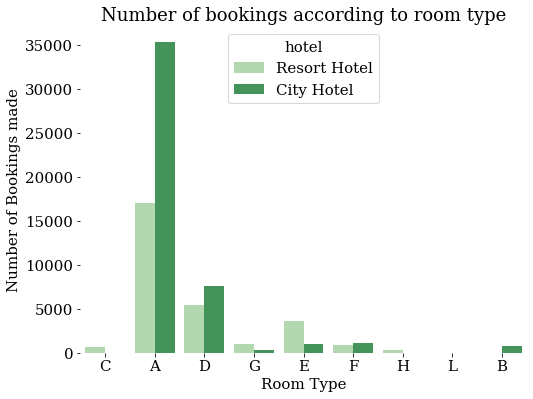

In [40]:
plt.figure(figsize=(8,5))
sns.countplot(x='reserved_room_type', hue='hotel', data=df3, palette="Greens")
plt.xlabel("Room Type")
plt.ylabel("Number of Bookings made")
plt.title("Number of bookings according to room type")
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(8,6)
plt.show()

Keterangan : Berdasarkan data diatas, tipe kamar dengan pemesanan terbanyak adalah A dan D. Tipe kamar L hampir tidak ada atau tidak ada pemesanan. Tipe kamar C, H, B memiliki jumlah pemesanan yang sangat sedikit

# the number of guests according to the number of nights they booked

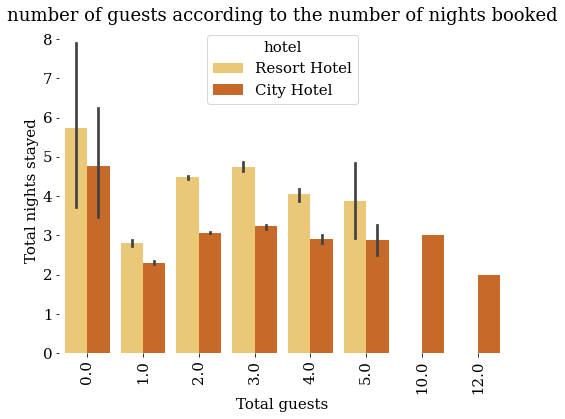

In [41]:
plt.figure(figsize = (12,6))
fig = sns.barplot(x = 'total_guests', 
             y = 'total_nights', 
             hue = 'hotel', 
             data = df3,
                 palette="YlOrBr")

plt.xticks(rotation=90)
plt.xlabel('Total guests')
plt.ylabel('Total nights stayed')
plt.title('number of guests according to the number of nights booked') 
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(8,6)
plt.show()

Keterangan : Berdasarkan data diatas, jumlah malam yang paling umum untuk reservasi dengan 1 tamu yang menginap di hotel adalah antara 1 dan 2 malam. Pemesanan dengan 2, 3, 4 dan 5 tamu biasanya menginap di hotel antara 3 dan 5 malam. Tidak ada data reservasi untuk 10 atau lebih dari 10 tamu untuk hotel Resort.

# the count of each number of adults per reservation

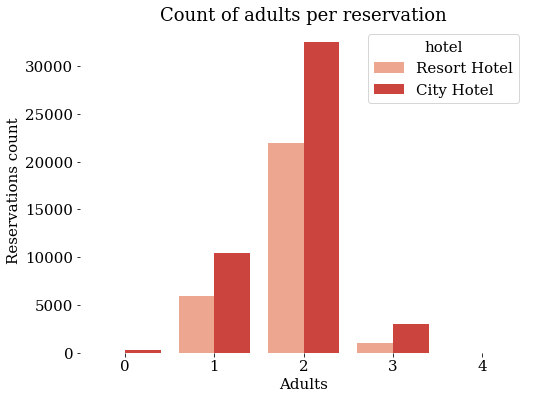

In [42]:
plt.figure(figsize=(8,5))
sns.countplot(x="adults", hue='hotel', data=df3, palette="Reds")
plt.xlabel("Adults")
plt.ylabel("Reservations count")
plt.title("Count of adults per reservation")
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(8,6)
plt.show()

Keterangan : Berdasarkan data diatas, tidak ada data reservasi untuk 10 atau lebih dari 10 tamu untuk hotel Resort. Hanya ada beberapa pemesanan dengan 3 orang dewasa.

# the percentage of the number of required car parking spaces

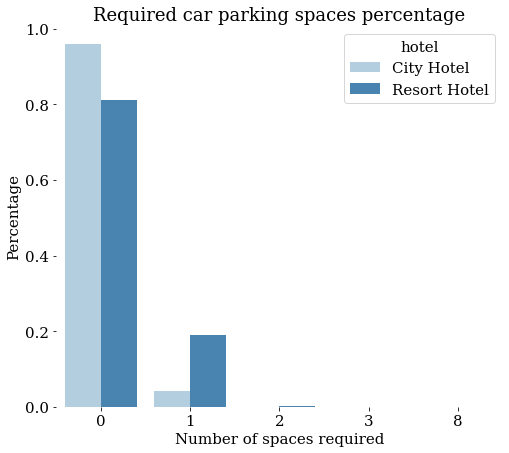

In [43]:
tp8 = pd.crosstab(index=df3['required_car_parking_spaces'],
                  columns=df3["hotel"], 
                  values=df3['total_guests'], 
                  aggfunc ="count", 
                  normalize='columns')

stacked = tp8.stack().reset_index().rename(columns={0:'total_guests'})

p = sns.barplot(x=stacked.required_car_parking_spaces, y=stacked.total_guests, hue=stacked.hotel, palette="Blues")
plt.title("Required car parking spaces percentage")
plt.ylabel("Percentage")
plt.xlabel("Number of spaces required")
sns.despine(bottom = True, left = True)
fig = plt.gcf()
fig.set_size_inches(8,7)
plt.show()

Keterangan : Berdasarkan data diatas, 90% tamu tidak memerlukan tempat parkir mobil. Hampir 19% pengunjung dari Resort Hotel membutuhkan setidaknya satu tempat parkir mobil. Hanya 4% pengunjung dari City Hotel yang membutuhkan setidaknya satu tempat parkir mobil.

